# Vq - VAE CelebA

This notebook is for implementing Discrete Latent Learning from the paper 
[Neural Discrete Representation Learning](https://arxiv.org/abs/1711.00937) with [Tensorflow](https://www.tensorflow.org/).

[CelebA dataset](https://www.kaggle.com/jessicali9530/celeba-dataset) dataset, which is 128x128 size, will be used.

Reference : [jiazhao97's Github](https://github.com/jiazhao97/VQ-VAE_withPixelCNNprior)

In [1]:
import os
os.environ['CUDA_VISIBLE_DEVICES']='3'

# Import Libraries

In [2]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import scipy
from sklearn.utils import shuffle
import cv2
import glob
import datetime

/home/mmc-server1/.local/lib/python3.5/site-packages/tensorflow/python/framework/dtypes.py:523: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/home/mmc-server1/.local/lib/python3.5/site-packages/tensorflow/python/framework/dtypes.py:524: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/home/mmc-server1/.local/lib/python3.5/site-packages/tensorflow/python/framework/dtypes.py:525: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/home/mmc-server1/.local/lib/python3.5/site-packages/tensorflow/python/frame

# Parameters

In [3]:
algorithm = 'VQVAE'

num_epoch  = 20

learning_rate=3e-4
commitment_loss=0.25

gpu_fraction = 0.9

image_size = 128
num_channel = 3

batch_size = 100

K=20
D=64

num_epoch_pixel=20
num_layers_pixelcnn=15

fmaps_pixelcnn=128
learning_rate_pixelcnn=3e-4
grad_clip_pixelcnn=1.0

load_model = False
train_model = True

save_path = "./saved_models/VQVAE+PixelCNN"

# Import CelebA Dataset

In [4]:
celebA_list = glob.glob('./../../../Server1/kyushik/GenerativeModel/img_align_celeba/*.jpg')

print("CelebA dataset Length: {}".format(len(celebA_list)))

CelebA dataset Length: 202599


# VQ-VAE Network

In [5]:
def ResNet(x, is_training, network_name):
    
    h = tf.layers.conv2d(x, filters=128, kernel_size=3, strides=1, padding='SAME',
                         name=network_name+'_R1')
    h = tf.contrib.layers.instance_norm(h)
    h = tf.nn.relu(h)
    h = tf.layers.conv2d(h, filters=128, kernel_size=3, strides=1, padding='SAME',
                         name=network_name+'_R2')
    h = tf.contrib.layers.instance_norm(h)
    h = x + h 
    h = tf.nn.relu(h)
    
    return h

def Encoder(x, is_training, reuse=False):
    with tf.variable_scope('encoder', reuse=reuse):
        
        e1=tf.layers.conv2d(x, filters=32, kernel_size=4, strides=2, padding='SAME')
        e1=tf.contrib.layers.instance_norm(e1)
        e1=tf.nn.relu(e1)
        
        e2=tf.layers.conv2d(e1, filters=64, kernel_size=4, strides=2, padding='SAME')
        e2=tf.contrib.layers.instance_norm(e2)
        e2=tf.nn.relu(e2)
        
        e3=tf.layers.conv2d(e2, filters=128, kernel_size=3, strides=1, padding='SAME')
        e3=tf.contrib.layers.instance_norm(e3)
        e3=tf.nn.relu(e3)
        
        e4=ResNet(e3,is_training, 'encoder'+'r1')
        e5=ResNet(e4,is_training, 'encoder'+'r2')
        
        e6=tf.layers.conv2d(e5, filters=D, kernel_size=1, strides=1, padding='SAME')
    
    return e6

def Decoder(x, is_training, reuse=False):
    
    with tf.variable_scope('decoder', reuse=reuse):
        
        d0 = tf.layers.conv2d(x,filters=128, kernel_size=3, strides=1, padding='SAME')
        d0 = tf.nn.relu(d0)
        
        d1=ResNet(d0, is_training, 'decoder'+ 'r1')      
        d2=ResNet(d1, is_training, 'decoder'+ 'r2')
                   
        d3 = tf.layers.conv2d_transpose(d2,filters=64, kernel_size=4, 
                                        strides=2, padding='SAME')
        d3 = tf.contrib.layers.instance_norm(d3)
        d3 = tf.nn.relu(d3)
               
        output = tf.layers.conv2d_transpose(d3, filters=num_channel, 
                    activation=tf.tanh,  kernel_size=4, strides=2, padding='SAME')
   
        return output


def VQ(x, beta, pixel_sample=None, pixel_flag=False):
    
    
    with tf.variable_scope('VQ', reuse=tf.AUTO_REUSE):
        embd_space=tf.get_variable(name='embd_space',shape=[D,K],
                                   initializer=tf.uniform_unit_scaling_initializer())
    
    
    if pixel_flag:
        pixel_sample=tf.reshape(pixel_sample, shape=[-1, 32, 32])
        pixel_sample = tf.cast(pixel_sample, tf.int32)
        vq_ind=pixel_sample
    
    else:
        matrix=tf.zeros([tf.shape(x)[0], tf.shape(x)[1], tf.shape(x)[2], 1])

        for i in range(K):

            embd_i=tf.reshape(embd_space[:,i], [1,1,1,D])
            embd_cal=tf.tile(embd_i, multiples=[tf.shape(x)[0], 
                            tf.shape(x)[1],tf.shape(x)[2],1])
            mat=tf.reshape(tf.reduce_sum(tf.square(tf.add(x,-embd_cal)),3),
                           [tf.shape(x)[0], tf.shape(x)[1],tf.shape(x)[2],1])
            matrix=tf.concat([matrix,mat],3)

        vq_ind=tf.argmin(matrix[:,:,:,1:K],3)
        vq_ind=tf.cast(vq_ind, tf.int32)
    
    rand_ind = tf.random_uniform(tf.shape(vq_ind), minval=0, maxval=1)
    rand_ind = tf.floor(rand_ind * K)
    rand_ind = tf.clip_by_value(rand_ind, 0, K-1)
    rand_ind = tf.cast(rand_ind, tf.int32)

    rand_zq=tf.nn.embedding_lookup(tf.transpose(embd_space), rand_ind)
    
    zq=tf.nn.embedding_lookup(tf.transpose(embd_space), vq_ind)
        
    embd_vq_loss=tf.reduce_mean((tf.stop_gradient(zq)-x)**2)
    enc_vq_loss=tf.reduce_mean((zq-tf.stop_gradient(x))**2)
    
    loss=embd_vq_loss+enc_vq_loss*beta
    
    zq=x+tf.stop_gradient(zq-x)
    
    return vq_ind, zq, rand_zq, loss

# PixelCNN Network

In [6]:
# Networks used in Pixel CNN

def get_weights_pixelcnn(shape, name, horizontal=False, mask=None):
    
    weights_initializer = tf.contrib.layers.xavier_initializer()
    W = tf.get_variable(name=name, shape=shape, dtype=tf.float32,
                        initializer=weights_initializer)
    if mask:
        filter_mid_y = shape[0]//2
        filter_mid_x = shape[1]//2
        mask_filter = np.ones(shape=shape, dtype=np.float32)

        if horizontal: 
            mask_filter[filter_mid_y+1:, :, :, :] = 0.0
            mask_filter[filter_mid_y, filter_mid_x+1:, :, :] = 0.0
            if mask == 'a':
                mask_filter[filter_mid_y, filter_mid_x, :, :] = 0.0
        else: 
            if mask == 'a':
                mask_filter[filter_mid_y:, :, :, :] = 0.0
            else:
                mask_filter[filter_mid_y+1:, :, :, :] = 0.0
        W *= mask_filter

    return W

def gated_conv_pixelcnn(W_shape_f, fan_in, horizontal, payload=None, mask=None):

    in_dim = fan_in.get_shape()[-1]
    W_shape = [W_shape_f[0], W_shape_f[1], in_dim, W_shape_f[2]]
    b_shape = W_shape[2]

    W_f = get_weights_pixelcnn(shape=W_shape, name="v_W", horizontal=horizontal, mask=mask)
    W_g = get_weights_pixelcnn(shape=W_shape, name="h_W", horizontal=horizontal, mask=mask)
    b_f_total = tf.get_variable(name="v_b", shape=b_shape, dtype=tf.float32,
                                initializer=tf.zeros_initializer)
    b_g_total = tf.get_variable(name="h_b", shape=b_shape, dtype=tf.float32,
                                initializer=tf.zeros_initializer)

    conv_f = tf.nn.conv2d(input=fan_in, filter=W_f, strides=[1,1,1,1], padding='SAME')
    conv_g = tf.nn.conv2d(input=fan_in, filter=W_g, strides=[1,1,1,1], padding='SAME')

    if payload is not None:
        conv_f += payload
        conv_g += payload

    fan_out = tf.multiply(tf.tanh(conv_f + b_f_total), tf.sigmoid(conv_g + b_g_total))
    return fan_out

def simple_conv_pixelcnn(W_shape_f, fan_in, activation=True):

    in_dim = fan_in.get_shape()[-1]
    W_shape = [W_shape_f[0], W_shape_f[1], in_dim, W_shape_f[2]]
    b_shape = W_shape_f[2]

    W = get_weights_pixelcnn(shape=W_shape, name="W")
    b = tf.get_variable(name="b", shape=b_shape, dtype=tf.float32, initializer=tf.zeros_initializer)

    conv = tf.nn.conv2d(input=fan_in, filter=W, strides=[1,1,1,1], padding='SAME')
    if activation:
        fan_out = tf.nn.relu(tf.add(conv, b))
    else:
        fan_out = tf.add(conv, b)
    return fan_out

def pixelcnn(z):
    inputs_shape = tf.shape(z)
    z= tf.reshape(z, [inputs_shape[0], inputs_shape[1], inputs_shape[2], 1])
    z = tf.cast(z, tf.float32)

    v_stack_in = z
    h_stack_in = z

    for i in range(num_layers_pixelcnn):
        filter_size = 9
        mask = 'b' if i > 0 else 'a'
        residual = True if i > 0 else False
        i = str(i)

        with tf.variable_scope("v_stack_pixelcnn"+i):
            v_stack = gated_conv_pixelcnn(W_shape_f=[filter_size, filter_size, fmaps_pixelcnn],
                                          fan_in=v_stack_in, horizontal=False, mask=mask)
            v_stack_in = v_stack

        with tf.variable_scope("v_stack_1_pixelcnn"+i):
            v_stack_1 = simple_conv_pixelcnn(W_shape_f=[1, 1, fmaps_pixelcnn], fan_in=v_stack_in)

        with tf.variable_scope("h_stack_pixelcnn"+i):
            h_stack = gated_conv_pixelcnn(W_shape_f=[1, filter_size, fmaps_pixelcnn],
                            fan_in=h_stack_in, horizontal=True, payload=v_stack_1, mask=mask)

        with tf.variable_scope("h_stack_1_pixelcnn"+i):
            h_stack_1 = simple_conv_pixelcnn(W_shape_f=[1, 1, fmaps_pixelcnn], fan_in=h_stack)
            if residual:
                h_stack_1 += h_stack_in
            h_stack_in = h_stack_1

    with tf.variable_scope("fc_1_pixelcnn"):
        fc1 = simple_conv_pixelcnn(W_shape_f=[1, 1, fmaps_pixelcnn], fan_in=h_stack_in)
    with tf.variable_scope("fc_2_pixelcnn"):
        fc2 = simple_conv_pixelcnn(W_shape_f=[1, 1, K], fan_in=fc1, activation=False)

    dist = tf.distributions.Categorical(logits=fc2)
    sampled_pixelcnn = dist.sample()
    log_prob_pixelcnn = dist.log_prob(sampled_pixelcnn)

    z = tf.reshape(z, tf.shape(z)[:-1])
    z = tf.cast(z, tf.int32)
    loss_per_batch = tf.reduce_sum(tf.nn.sparse_softmax_cross_entropy_with_logits(logits=fc2,
                                            labels=z), axis=[1,2])
    loss_pixelcnn = tf.reduce_mean(loss_per_batch)

    return {'loss_pixelcnn': loss_pixelcnn,
            'sampled_pixelcnn': sampled_pixelcnn,
            'log_prob_pixelcnn': log_prob_pixelcnn}

# Build Graph

In [7]:
tf.reset_default_graph()

x=tf.placeholder(tf.float32, shape=[None, image_size, image_size, num_channel])
is_training=tf.placeholder(tf.bool)

pixel_train=tf.placeholder(tf.float32, shape=[None, 32, 32])
pixelcnn_sample=tf.placeholder(tf.float32, shape=[None, 32, 32])
pixel_is_training=tf.placeholder(tf.bool)

ze_=Encoder(x,is_training)
vq_index, zq_, rn_zq, vq_loss=VQ(ze_, commitment_loss)
x_recon=Decoder(zq_,is_training)

recon_loss=tf.reduce_mean((x_recon-x)**2)
loss=recon_loss+vq_loss

optimizer = tf.train.AdamOptimizer(learning_rate=learning_rate) 
vq_optimzer = optimizer.minimize(loss)

pixel=pixelcnn(pixel_train)

_, zq_pixel, _, _=VQ(ze_, commitment_loss, pixelcnn_sample ,pixel_flag=True)
pixel_recon=Decoder(zq_pixel, False, True)

trainer_pixelcnn = tf.train.RMSPropOptimizer(learning_rate=learning_rate_pixelcnn)
gradients_pixelcnn = trainer_pixelcnn.compute_gradients(pixel["loss_pixelcnn"])
clipped_gradients_pixelcnn = map(lambda gv: gv if gv[0] is None else [tf.clip_by_value(gv[0],
                            -grad_clip_pixelcnn, grad_clip_pixelcnn), gv[1]], gradients_pixelcnn)
optimizer_pixelcnn= trainer_pixelcnn.apply_gradients(clipped_gradients_pixelcnn)

Instructions for updating:
Use tf.initializers.variance_scaling instead with distribution=uniform to get equivalent behavior.


# Initialization & Load Model

In [8]:
config = tf.ConfigProto(gpu_options=tf.GPUOptions(per_process_gpu_memory_fraction=1))
sess = tf.Session(config=config)
Saver=tf.train.Saver()
    
init=tf.global_variables_initializer()
sess.run(init)

Saver = tf.train.Saver()

if load_model == True:
    Saver.restore(sess, load_path)

# Train VQ-VAE

In [9]:
if train_model:
    len_data=len(celebA_list)
    
    for i in range(num_epoch):
        np.random.shuffle(celebA_list)
        
        batch_count=0
        
        for j in range(0, len_data, batch_size):
            if j + batch_size < len_data:
                x_in = np.zeros([batch_size, image_size, image_size, 3])

                for k in range(batch_size):
                    img_temp = cv2.cvtColor(cv2.imread(celebA_list[j + k]),cv2.COLOR_BGR2RGB)
                    x_in[k,:,:,:] = img_temp[45:45 + image_size, 25: 25+image_size, :]
                    
            x_in=x_in.reshape((-1, image_size, image_size, 3))
            x_in=x_in/255
            x_in=(x_in-0.5)/0.5
            
            sess.run(vq_optimzer, feed_dict={x: x_in, is_training:True})
            
            print ("Batch: {}".format(j/len_data), end="\r")
    
            
print("\n")
print("VQ-VAE trained")

Batch: 0.9995113500066634765

VQ-VAE trained


# Test (Reconstruction)

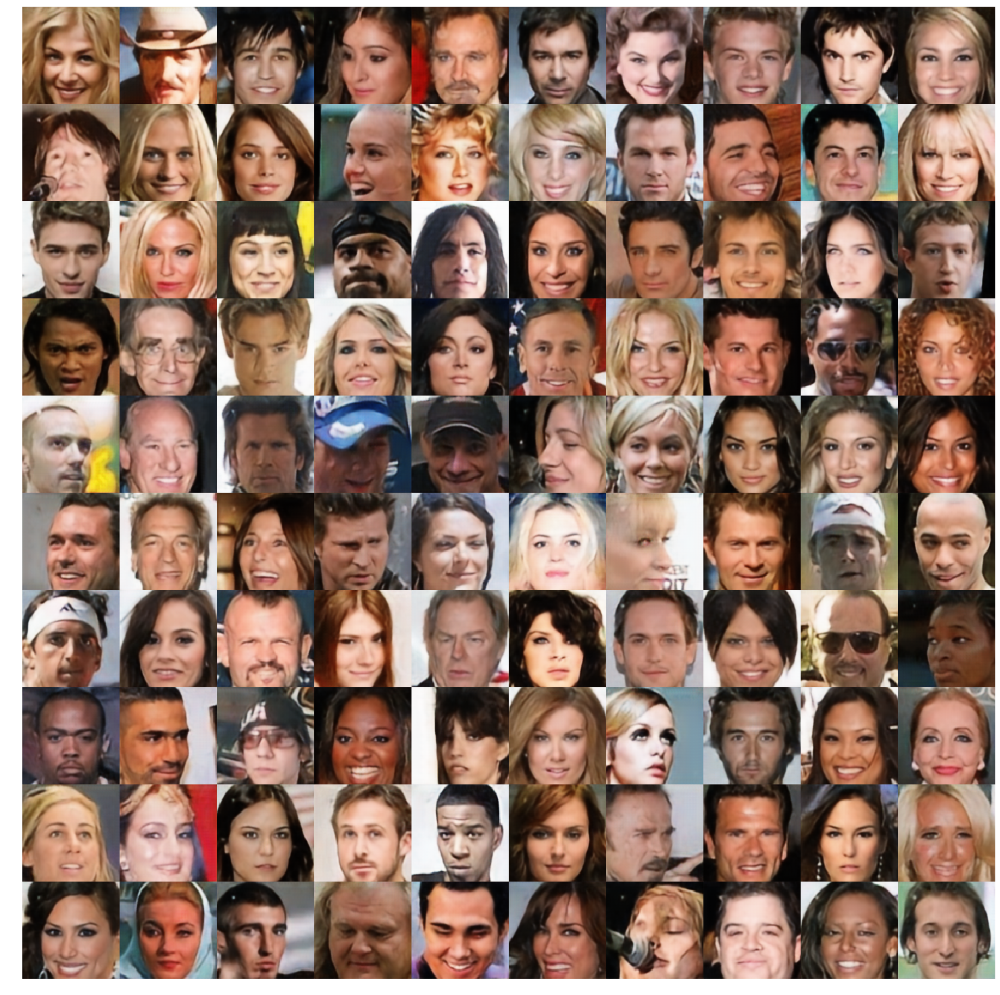

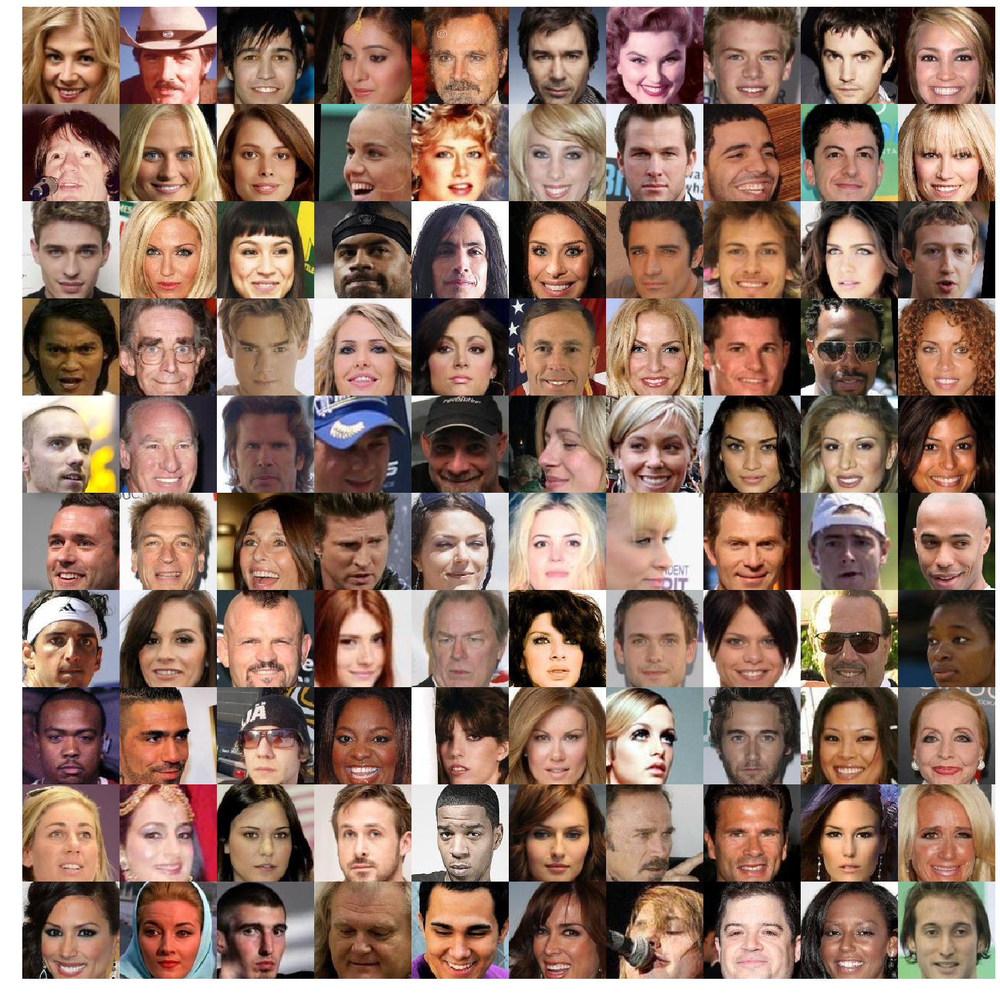

In [10]:
f, ax = plt.subplots(10, 10, figsize=(20, 20))
f.subplots_adjust(left = 0, bottom = 0, right = 1, top = 1, hspace = 0, wspace = 0)

f1, ax1 = plt.subplots(10, 10, figsize=(20, 20))
f1.subplots_adjust(left = 0, bottom = 0, right = 1, top = 1, hspace = 0, wspace = 0)

for i in range(10):       

    for j in range(10):
        num=np.random.randint(len_data)
        
        img_=cv2.cvtColor(cv2.imread(celebA_list[num]),cv2.COLOR_BGR2RGB)
        test_x = img_[45:45 + image_size, 25: 25+image_size, :]

        test_x=test_x/255
        test_x=(test_x-0.5)/0.5
        
        yy=sess.run(vq_index, feed_dict={x:[test_x], is_training:False})
        
        yy[0,5,5]=yy[0,5,5]+5

        xx=sess.run(pixel_recon, feed_dict={x:[test_x], pixelcnn_sample:yy})
        
        xx=(xx+1.0)/2
        test_x=(test_x+1.0)/2

        xx=np.reshape(xx, [image_size,image_size,3])

        ax[i][j].imshow(xx)
        ax[i][j].axis("off")
        
        ax1[i][j].imshow(test_x)
        ax1[i][j].axis("off")

plt.show()

# Training PixelCNN

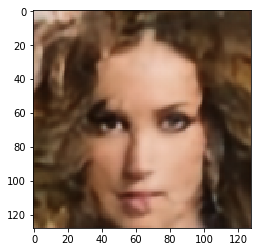

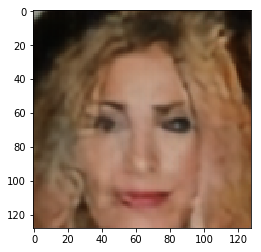

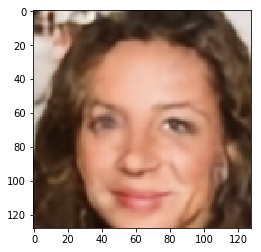

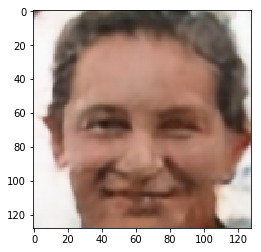

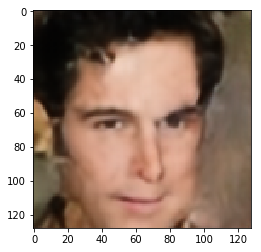

...

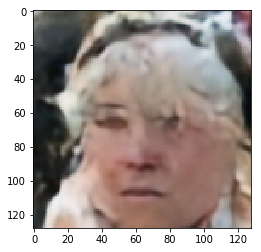

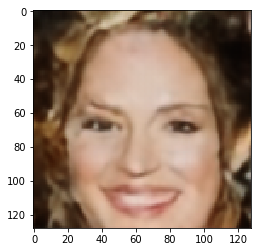

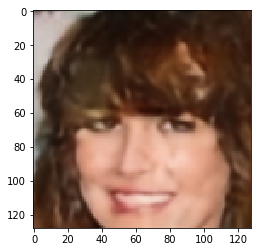

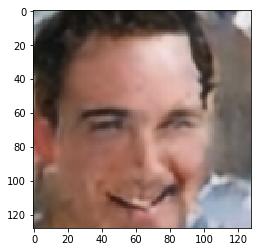

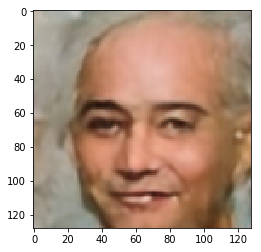

In [24]:
if train_model:

    for i in range(30):
        np.random.shuffle(celebA_list)

        batch_count=0

        for j in range(0,len_data,batch_size):           
            if j + batch_size < len_data:
                x_in = np.zeros([batch_size, image_size, image_size, 3])

                for k in range(batch_size):
                    img_temp = cv2.cvtColor(cv2.imread(celebA_list[j + k]),cv2.COLOR_BGR2RGB)
                    x_in[k,:,:,:] = img_temp[45:45 + image_size, 25: 25+image_size, :]
                    
            x_in=x_in.reshape((-1, image_size, image_size, 3))
            x_in=x_in/255           
            x_in=(x_in-0.5)/0.5
                            
            batch_count+=1

            vq_latent=sess.run(vq_index, feed_dict={x: x_in, is_training: False})
                    
            sess.run(optimizer_pixelcnn, feed_dict={x: x_in, pixel_train: vq_latent})
                
            print ("Batch: {}".format(j/len_data), end="\r")
        
            if (batch_count%1000)==0:
                sample_pixel=sess.run(pixel, feed_dict={pixel_train: vq_latent})

                pixel_re=sess.run(pixel_recon, feed_dict={x:x_in,
                                        pixelcnn_sample: sample_pixel["sampled_pixelcnn"]})

                pixel_re=(pixel_re+1.0)/2

                pixel_re=np.reshape(pixel_re, [-1,image_size,image_size,3])

                plt.imshow(pixel_re[0])
                plt.show()



# PixelCNN Trained Latent Decoded

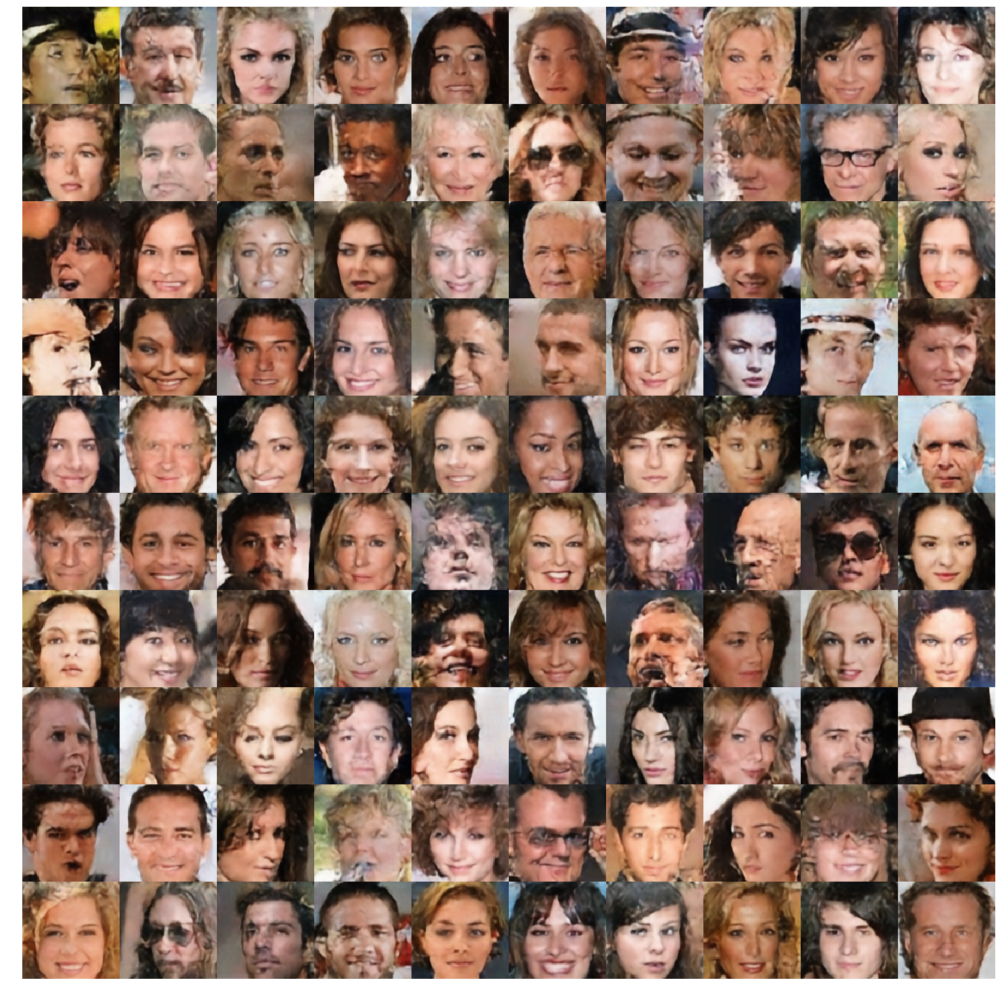

In [34]:
f, ax = plt.subplots(10, 10, figsize=(20, 20))
f.subplots_adjust(left = 0, bottom = 0, right = 1, top = 1, hspace = 0, wspace = 0)


x_in = np.zeros([batch_size, image_size, image_size, 3])

for k in range(batch_size):
    img_temp = cv2.cvtColor(cv2.imread(celebA_list[k]),cv2.COLOR_BGR2RGB)
    x_in[k,:,:,:] = img_temp[45:45 + image_size, 25: 25+image_size, :]
    
x_in=x_in.reshape((-1, image_size, image_size, 3))
x_in=x_in/255           
x_in=(x_in-0.5)/0.5

vq_latent=sess.run(vq_index, feed_dict={x: x_in, is_training: False})

sample_pixel=sess.run(pixel, feed_dict={pixel_train: vq_latent})
random_test=np.zeros((128,128,3))

pixel_re=sess.run(pixel_recon, feed_dict={x:[random_test], 
                                    pixelcnn_sample: sample_pixel["sampled_pixelcnn"]})

xx=np.reshape(pixel_re, [-1,image_size,image_size,3])

xx=(xx+1.0)/2

for i in range(10):       

    for j in range(10):

        ax[i][j].imshow(xx[i*10+j])
        ax[i][j].axis("off")

plt.show()